<div class="alert alert-block alert-success">
# USA Flights Analysis with Python

<div class="alert alert-block alert-warning">
**Due to huge amount of data, the interactive graphs and maps take few minutes to load.**
</div>

<div class="alert alert-block alert-info">
**Please refer this link to download the data files : https://drive.google.com/drive/folders/1tL9xHPbr_WWn8wF2Z0DzXvkPJsEkxi51?usp=sharing**
</div>


<br> <br>
## Dataset Description

**The dataset is extracted from *https://www.transportation.gov/* (United States Bureau of Transportation Statistics) which contains USA domestic flight records for the year 2017.**
<br> <br>
**It contains approximately 5.6 million records with 70 columns. (~2 GB) **

<li>One row indicates a particular flight giving details about the arrival,departures,schedules,delays,origin,destination airports and the distance covered for that particular flight during the year 2017. <br>

<li>For the arrivals and departures, the time is in minutes and positive minutes indicate delay and negative minutes indicate early arrivals or early departures. 
    
<li>The values in the columns which give reasons for the delays(weather,aircraft, national aircraft security) are of type BOOLEAN.
    
<li>CRS time means the time printed on the flight tickets which includes the buffer times of delays such as taxi in and taxi out.
    
<li>Each DISTANCE_GROUP count is incremented for every 250 miles. (0-250 miles is group 1, 250-500 miles is group 2 etc.)
    
<li>DEP_DELAY_GROUP & ARR_DELAY_GROUP is for every 15 minutes of DELAY. 
    
<li>Rest all other columns are self-explanatory.

<br><br>
Importing the necessary libraries and modules

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
%pylab inline


import sklearn as sk
import sklearn.tree as tree
from IPython.display import Image  
import pydotplus

Populating the interactive namespace from numpy and matplotlib


#### Set the option to display 100 rows and 100 columns

In [2]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

### Load monthly data from individual csv files

In [3]:
df_jan = pd.read_csv("JAN 2017/JAN 2017.csv",low_memory=False)

In [4]:
df_feb = pd.read_csv("FEB 2017/FEB 2017.csv",low_memory=False)


In [5]:
df_mar = pd.read_csv("MAR 2017/MAR 2017.csv",low_memory=False)

In [6]:
df_apr = pd.read_csv("APRIL 2017/APRIL 2017.csv",low_memory=False)

In [7]:
df_may = pd.read_csv("MAY 2017/MAY 2017.csv",low_memory=False)

In [8]:
df_june = pd.read_csv("JUNE 2017/JUNE 2017.csv",low_memory=False)

In [9]:
df_july = pd.read_csv("JULY 2017/JULY 2017.csv",low_memory=False)

In [10]:
df_aug = pd.read_csv("AUG 2017/AUG 2017.csv",low_memory=False)

In [11]:
df_sep = pd.read_csv("SEPT 2017/SEPT 2017.csv",low_memory=False)

In [12]:
df_oct = pd.read_csv("OCT 2017/OCT 2017.csv",low_memory=False)


In [13]:
df_nov = pd.read_csv("NOV 2017/NOV 2017.csv",low_memory=False)

In [14]:
df_dec = pd.read_csv("DEC 2017/DEC 2017.csv",low_memory=False)


# DATA CLEANING & PREPARATION
<br><br>** Since the dataset is huge, we had to clean the data in individual monthly files.**<br>
**The data we got was from a government site, it was pretty structured and cleaned. ** <br>

We filled the Missing values with '0' to indicate that the field is not applicable

In [15]:
df_jan=df_jan.fillna('0')

In [16]:
df_feb=df_feb.fillna('0')

In [17]:
df_mar=df_mar.fillna('0')

In [18]:
df_apr=df_apr.fillna('0')

In [19]:
df_may=df_may.fillna('0')

In [20]:
df_june=df_june.fillna('0')

In [21]:
df_july=df_july.fillna('0')

In [22]:
df_aug=df_aug.fillna('0')

In [23]:
df_sep=df_sep.fillna('0')

In [24]:
df_oct=df_oct.fillna('0')

In [25]:
df_nov=df_nov.fillna('0')

In [26]:
df_dec=df_dec.fillna('0')

#### Combining all montly records to a single dataframe.

In [27]:
df=df_jan.append(df_feb)

In [28]:
df=df.append(df_mar)

In [29]:
df=df.append(df_apr)

In [30]:
df=df.append(df_may)

In [31]:
df=df.append(df_june)

In [32]:
df=df.append(df_july)

In [33]:
df=df.append(df_aug)

In [34]:
df=df.append(df_sep)

In [35]:
df=df.append(df_oct)

In [36]:
df=df.append(df_nov)

In [37]:
df=df.append(df_dec)


#### Merge airlines.csv to get the airline names

In [38]:
airlines=pd.read_csv("airlines.csv")

In [39]:
df=df.merge(airlines, how='left', left_on='CARRIER',right_on='IATA_CODE')

In [40]:
df.head(1)

,YEAR,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,AIRLINE_ID,CARRIER,TAIL_NUM,FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_NM,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_NM,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DEL15,DEP_DELAY_GROUP,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DEL15,ARR_DELAY_GROUP,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,Unnamed: 65,IATA_CODE,AIRLINE
0,2017,1,10,2,2017-01-10,19805,AA,N128AA,1655,11057,CLT,"Charlotte, NC",North Carolina,12451,JAX,"Jacksonville, FL",Florida,1805,1801,-4,0,-1,13,1814,1904,7,1925,1911,-14,0,-1,0.0,0,0.0,80,70,50,1.0,328.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,AA,American Airlines Inc.


#### Drop unwanted columns

In [41]:
df.drop(['DIV2_AIRPORT', 'DIV2_AIRPORT_ID',
       'DIV2_AIRPORT_SEQ_ID', 'DIV2_WHEELS_ON', 'DIV2_TOTAL_GTIME',
       'DIV2_LONGEST_GTIME', 'DIV2_WHEELS_OFF', 'DIV2_TAIL_NUM', 'Unnamed: 65',
       'IATA_CODE'], axis=1, inplace=True)

In [42]:
df1=df.copy()

#### Since the time records were not in datetime format, for example 1020 meant 10:20 hrs. Therefore we wrote a function to convert the values in the required format.
#### Define function to format the time columns.

In [43]:
def format_columns(v):
    if pd.isnull(v):
        return np.nan
    else:
        if v == 2400: v = 0
        v = "{0:04d}".format(int(v))
        val = datetime.time(int(v[0:2]), int(v[2:4]))
        return val


#### Call format_columns function on the required columns

In [44]:
df1['CRS_DEP_TIME'] = df1['CRS_DEP_TIME'].apply(format_columns)


In [45]:
df1['DEP_TIME'] = df1['DEP_TIME'].apply(format_columns)


In [46]:
df1['CRS_ARR_TIME'] = df1['CRS_ARR_TIME'].apply(format_columns)


In [47]:
df1['ARR_TIME'] = df1['ARR_TIME'].apply(format_columns)

In [48]:
# While reruning, you can skip the above steps and load the data into datframe by uncommenting the following line
#df=pd.read_csv("Flights_data.csv")

#### Check the contents of the merged files

In [49]:
df1.head()

,YEAR,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,AIRLINE_ID,CARRIER,TAIL_NUM,FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_NM,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_NM,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DEL15,DEP_DELAY_GROUP,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DEL15,ARR_DELAY_GROUP,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,AIRLINE
0,2017,1,10,2,2017-01-10,19805,AA,N128AA,1655,11057,CLT,"Charlotte, NC",North Carolina,12451,JAX,"Jacksonville, FL",Florida,18:05:00,18:01:00,-4,0,-1,13,1814,1904,7,19:25:00,19:11:00,-14,0,-1,0.0,0,0.0,80,70,50,1.0,328.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,American Airlines Inc.
1,2017,1,11,3,2017-01-11,19805,AA,N710AA,1655,11057,CLT,"Charlotte, NC",North Carolina,12451,JAX,"Jacksonville, FL",Florida,18:05:00,18:11:00,6,0,0,18,1829,1923,4,19:25:00,19:27:00,2,0,0,0.0,0,0.0,80,76,54,1.0,328.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,American Airlines Inc.
2,2017,1,12,4,2017-01-12,19805,AA,N709AA,1655,11057,CLT,"Charlotte, NC",North Carolina,12451,JAX,"Jacksonville, FL",Florida,18:05:00,18:07:00,2,0,0,26,1833,1923,6,19:25:00,19:29:00,4,0,0,0.0,0,0.0,80,82,50,1.0,328.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,American Airlines Inc.
3,2017,1,13,5,2017-01-13,19805,AA,N730AA,1655,11057,CLT,"Charlotte, NC",North Carolina,12451,JAX,"Jacksonville, FL",Florida,18:05:00,18:01:00,-4,0,-1,21,1822,1916,6,19:25:00,19:22:00,-3,0,-1,0.0,0,0.0,80,81,54,1.0,328.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,American Airlines Inc.
4,2017,1,14,6,2017-01-14,19805,AA,N700AA,1655,11057,CLT,"Charlotte, NC",North Carolina,12451,JAX,"Jacksonville, FL",Florida,18:05:00,18:04:00,-1,0,-1,16,1820,1917,6,19:25:00,19:23:00,-2,0,-1,0.0,0,0.0,80,79,57,1.0,328.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,American Airlines Inc.


In [50]:
len(df)

5674621

## INSIGHT- 1

<div class="alert alert-block alert-success">
<br>
**There are few flights which arrive early despite of the departure delay.**



<br>
</div>

We think if the flight is delayed, it will arrive late. This insight was contradictory to this general belief and we thought it was interesting. 

**VALIDATION OF INSIGHT-1**

In [51]:
#Creating a dataframe which includes DEP_DELAY (departure delay) and ARR_DELAY(arrival_delay) only.
DF2 = df[['DEP_DELAY','ARR_DELAY']].astype(float)


Importing Kmeans algorithm and and defining the cluster size

In [52]:
from sklearn.cluster import KMeans
clu = KMeans(n_clusters=3)

Training the dataset using Kmeans

In [53]:
clu.fit(DF2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [54]:
clu.labels_[0:20]


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

Copying the data into new df to avoid unwanted changes in original data.

In [55]:
df2 = DF2.copy()

Creating a new column named cluster which will store the classified cluster result for it.

In [56]:
df2['cluster']=clu.labels_

Taking the mean of each cluster.

In [57]:
df3=df2.groupby('cluster').mean()

In [58]:
df3

,DEP_DELAY,ARR_DELAY
cluster,,
0,1.849170,-3.701989
1,121.278625,119.624648
2,659.669278,651.941197


<div class="alert alert-block alert-info">
<br>
**Using machine learning's clustering technique, we found out that cluster 1 stood out from others which was because it had positive departure delay and negative arrival delay.**



<br>
</div>

#### Plot the cluster

In [59]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()  # for plot styling


In [60]:
y_kmean=clu.predict(DF2)

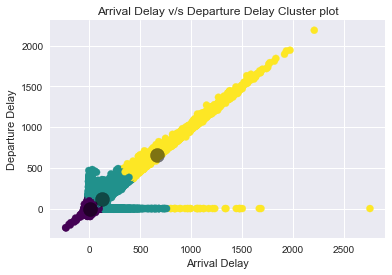

In [61]:
plt.scatter(DF2.iloc[:, 0], DF2.iloc[:, 1],c=y_kmean, s=50, cmap='viridis')
plt.ylabel('Departure Delay')
plt.xlabel('Arrival Delay')
plt.title('Arrival Delay v/s Departure Delay Cluster plot')
centers = clu.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=200, alpha=0.5);

The 3 black points are the cluster centroids.

### To find such flights that are delayed but arrived early, we looked into delayed flights per Carrier(Airline)

### Percentage of delays per carrier based on total no. of flights of that carrier

In [62]:
delay1= df[df['DEP_DELAY'].astype(float)>0]

#### Group by Airlines to find the percentage of delayed flights for each airline

In [63]:
max_delays=((delay1.groupby('AIRLINE')[['AIRLINE']].size()/df.groupby('AIRLINE')[['AIRLINE']].size())*100)\
.sort_values(ascending=False)

In [64]:
max_delays

AIRLINE
Southwest Airlines Co.         46.267086
Virgin America                 40.768656
JetBlue Airways                39.883946
Frontier Airlines Inc.         36.045891
American Airlines Inc.         31.517669
United Air Lines Inc.          31.501452
Delta Air Lines Inc.           30.423037
Spirit Air Lines               30.233774
Hawaiian Airlines Inc.         28.506212
Atlantic Southeast Airlines    27.836697
Alaska Airlines Inc.           26.826896
Skywest Airlines Inc.          26.266371
dtype: float64

#### Plot the graph for airline delays

In [65]:
df1 = pd.DataFrame(data=max_delays.index, columns=['AIRLINE'])
df2 = pd.DataFrame(data=max_delays.values, columns=['Percentage'])
df3 = pd.merge(df1, df2, left_index=True, right_index=True)

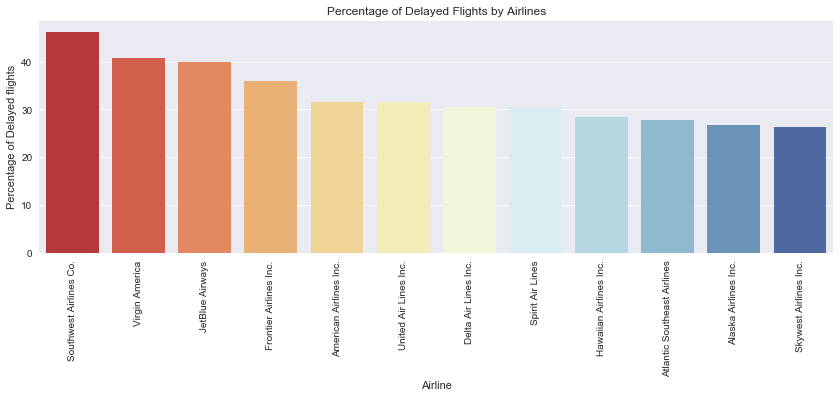

In [66]:
a = sns.factorplot(y='Percentage', data=df3, x='AIRLINE',aspect=3, kind='bar',legend_out=True,size=4,palette='RdYlBu')
a.despine(left = True)
a.set_ylabels("Percentage of Delayed flights")
a.set_xlabels("Airline")
plt.title('Percentage of Delayed Flights by Airlines')
a.set_xticklabels(rotation=90)


### The above graph shows that Southwest Airlines has maximum percentage of delays.


### Number of flights by carrier which are delayed but arrive earlier than/on the scheduled arrival time.


#### Filter the flights which have positive departure delay but negative/zero arrival delay

In [67]:
delay_early=df[(df['DEP_DELAY'].astype(float)>0) & ((df['ARR_DELAY'].astype(float)<=0))]

In [68]:
delay1= df[df['DEP_DELAY'].astype(float)>0]

#### Group by airlines to find the percentage of delayed but arirved early flights for each airline

In [69]:
delayed_but_early=(((delay_early.groupby('AIRLINE').size())/(delay1.groupby('AIRLINE').size()))*100)\
.sort_values(ascending=False)

#### Plot the graph for delayed but arrived early flights for each airline

In [70]:
df1 = pd.DataFrame(data=delayed_but_early.index, columns=['AIRLINE'])

In [71]:
df2 = pd.DataFrame(data=delayed_but_early.values, columns=['Percentage'])

In [72]:
df4 = pd.merge(df1, df2, left_index=True, right_index=True)

In [73]:
df3['early_percent'] = df4.Percentage

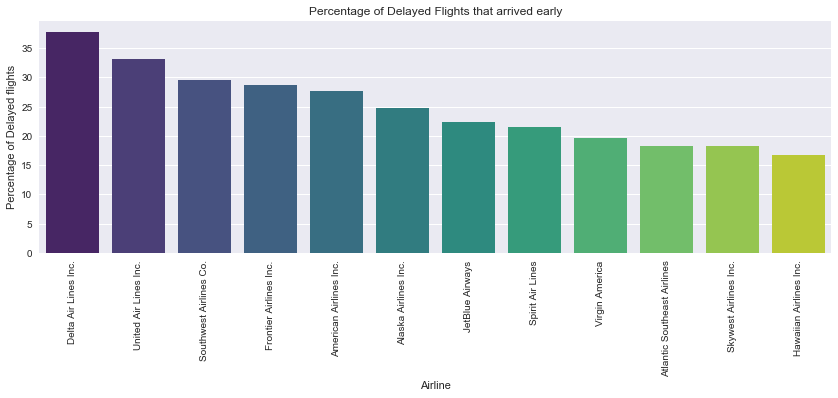

In [74]:
a = sns.factorplot(y='Percentage', data=df4, x='AIRLINE',aspect=3, kind='bar',legend_out=True,size=4,palette='viridis')
a.despine(left = True)
a.set_ylabels("Percentage of Delayed flights")
a.set_xlabels("Airline")
plt.title('Percentage of Delayed Flights that arrived early')
a.set_xticklabels(rotation=90)

### Even though percentage of delays for SouthWest airlines is the highest, it ranks amongst the top 3 airlines which arrive on time or before scheduled arrival time. <br> As we can see Delta airlines has the highest % of on time arrival.</br>

### Visualize flights for Southwest and Delta airlines

In [75]:
swd_delay = df[(df['DEP_DELAY'].astype(float)>0) & (df['ARR_DELAY'].astype(float)<0) & ((df.CARRIER == 'WN')|(df.CARRIER == 'DL'))]

In [76]:
flight_count = swd_delay.groupby(['ORIGIN','DEST'],as_index=False)[['YEAR']].count().\
rename(columns={'YEAR':'COUNT'}).sort_values(by='COUNT',ascending=False)

In [77]:
airports =pd.read_csv("airports.csv",low_memory=False)

In [78]:
flight_count = flight_count.merge(airports,left_on='ORIGIN',right_on='IATA_CODE')

In [79]:
flight_count.rename(columns={'LATITUDE':'LATITUDE_ORG','LONGITUDE':'LONGITUDE_ORG'},inplace=True)

In [80]:
flight_count = flight_count.merge(airports,left_on='DEST',right_on='IATA_CODE')

In [81]:
flight_count.rename(columns={'LATITUDE':'LATITUDE_DEST','LONGITUDE':'LONGITUDE_DEST'},inplace=True)

In [82]:
flight_count = flight_count.sort_values(by='COUNT',ascending=False)

In [83]:
import plotly
import plotly.plotly as py
from plotly.graph_objs import *

plotly.tools.set_credentials_file(username='prachitamhankar', api_key='rXC6S9ev3GOFXIhXZnYh')


mapbox_access_token = 'pk.eyJ1IjoicHJhY2hpdGFtaGFua2FyIiwiYSI6ImNqaGZ2N3VtajFkYTIzNm5td3V0NmMxanEifQ.uF6TYlE_3PbQwoPhUCkFrw'

airports = Data([
    Scattermapbox(
        lat=flight_count.LATITUDE_ORG,
        lon=flight_count.LONGITUDE_ORG,
        mode='markers',
        marker=Marker(
            size=4,
            # color =final['COUNT'],
           # colorscale= 'Jet',
            showscale=False,
            cmax=121,
            cmin=0
        ),
        text=flight_count['ORIGIN'],
    )
])

flight_paths = []
for i in range(500):
    flight_paths.append(
        dict(
            type = 'scattermapbox',
            #locationmode = 'USA-states',
            lon = [ flight_count['LONGITUDE_ORG'][i], flight_count['LONGITUDE_DEST'][i] ],
            lat = [ flight_count['LATITUDE_ORG'][i], flight_count['LATITUDE_DEST'][i] ],
            mode = 'lines', 
            hoverinfo = 'text',
            text = flight_count.ORIGIN[i] + ' -> ' + flight_count.DEST[i],
            
            # text = 'ORIGIN',
            line = dict(
                width = 1,
                color = 'red',
            ),
           opacity = float(flight_count['COUNT'][i])/float(flight_count['COUNT'].max()),
        )
    )

layout = dict(
        title = 'Southwest and Delta Airlines Delayed but Early Arrival Flights',
        mapbox=dict(
                accesstoken=mapbox_access_token,
                bearing=0,
                center=dict(
                    lat=40,
                    lon=-98
                ),
                pitch=0,
                zoom=3,
                style='dark'
            ))



fig = dict(data=airports+flight_paths, layout=layout)
py.iplot(fig, filename='Southwest Delta flights')


High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~prachitamhankar/0 or inside your plot.ly account where it is named 'Southwest Delta flights'


** The above map is interactive and shows the flight network of Southwest and Delta airlines of the flights that were delayed but have arrived early.** <br><br> **Due to constraints in plotly and dataset size, we could map only top 500 frequent combinations of the above stated flights** <br><br>
**
The opacity of the lines on graph are decided based on the frequency of flights between those two airports.**

<br><br>

# MANAGERIAL INSIGHT - 1

<div class="alert alert-block alert-info">
<br>
**By further digging deep, we found out that Southwest Airlines have a better CRS time management as compared to others. 
The airlines with a higher CRS time than the actual elapsed time can keep their passengers happy as they give a sense of perception to the flyers that even if the flight gets delayed, it still manages to reach on time. So in order to maintain a happy customer base and attract more flyers, the CRS time for each flight should we well adjusted considering all the possible factors affecting the flight schedule.**



<br>
</div>

<br><br>
# INSIGHT - 2

<div class="alert alert-block alert-success">
<br>
**Predicting Arrival delays using Regression Models for better flight management**

<br>
</div>




#### Using Lasso will try to minimize the number of attributes used for the prediction, which gives us insights about which attributes are most important.

In [84]:
df_reg=df[['MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK', 'AIRLINE_ID', 'ORIGIN_AIRPORT_ID','DEST_AIRPORT_ID','CRS_DEP_TIME', 'DEP_TIME',
       'DEP_DELAY', 'DEP_DEL15', 'DEP_DELAY_GROUP', 'TAXI_OUT', 'WHEELS_OFF',
       'WHEELS_ON', 'TAXI_IN', 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY',
       'ARR_DEL15', 'ARR_DELAY_GROUP', 'CANCELLED', 'CANCELLATION_CODE',
       'DIVERTED', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'DISTANCE', 'DISTANCE_GROUP', 'CARRIER_DELAY',
       'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY',
       'DIV_AIRPORT_LANDINGS', ]]

In [85]:
from sklearn import linear_model
regLasso = linear_model.Lasso()

In [86]:
df_reg=pd.get_dummies(df_reg, columns=['CANCELLATION_CODE'])

#### Make X and Y

In [87]:
X = df_reg.drop('ARR_DELAY',axis=1)

Y = df_reg.ARR_DELAY

#### Train the model Lasso regression model

In [88]:
regLasso.fit(X,Y)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

In [89]:
s = pd.Series({X.columns[i] : regLasso.coef_[i]
               for i in range(0,len(X.columns))} )

#### Eliminate columns that have value 0

In [90]:
s[s != 0]

ACTUAL_ELAPSED_TIME    0.135831
AIRLINE_ID            -0.001492
ARR_DELAY_GROUP        4.258817
ARR_TIME              -0.000980
CARRIER_DELAY          0.448538
CRS_ARR_TIME           0.001797
CRS_DEP_TIME           0.009358
CRS_ELAPSED_TIME      -0.260083
DEP_DELAY              0.469563
DEP_DELAY_GROUP       -1.234765
DEP_TIME              -0.010412
DEST_AIRPORT_ID        0.000267
DISTANCE               0.013334
LATE_AIRCRAFT_DELAY    0.392379
NAS_DELAY              0.433546
ORIGIN_AIRPORT_ID     -0.000088
TAXI_IN                0.237267
TAXI_OUT               0.244142
WEATHER_DELAY          0.432920
WHEELS_OFF             0.000213
WHEELS_ON             -0.000339
dtype: float64

#### Plot the graph for Arrival delay vs Departure delay and Arrival delay vs Distance. <br>
#### Since the data is huge, plotting graphs using all records was impossible, hence we have plotted the graphs using random samples of the data

In [91]:
df_plot=df_reg.sample(frac=0.3)

In [92]:
df_plot=df_plot.astype(float)

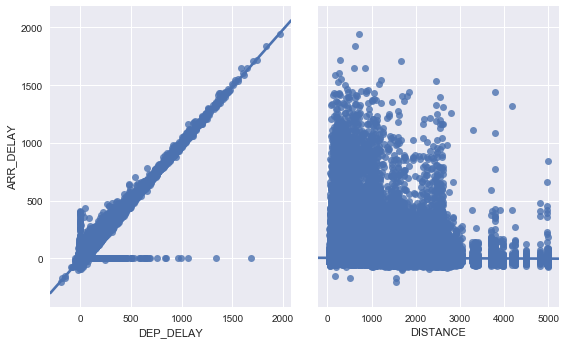

In [93]:
sns.pairplot(df_plot, x_vars=["DEP_DELAY","DISTANCE"], y_vars=["ARR_DELAY"],
             size=5, aspect=.8, kind="reg");

## Lasso Model to train and predict delays


In [94]:
df_reg=df[['AIRLINE_ID', 'ORIGIN_AIRPORT_ID','DEST_AIRPORT_ID','CRS_DEP_TIME', 'DEP_TIME',
       'DEP_DELAY','DEP_DELAY_GROUP', 'TAXI_OUT', 'WHEELS_OFF',
       'WHEELS_ON', 'TAXI_IN', 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY',\
       'CANCELLED','CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'DISTANCE', 'CARRIER_DELAY',
       'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY' ]]

#### Make X and Y

In [95]:
X = df_reg.drop('ARR_DELAY',axis=1)

Y = df_reg.ARR_DELAY

#### Spilt X and Y into training and test data.

In [96]:
 #Split the data into training/testing(80:20) sets
X_train = X[:-4539696]
X_test =  X[-4539696:]

# Split the targets into training/testing(80:20) sets
Y_train = Y[:-4539696]
Y_test = Y[-4539696:]


#### Train the Lasso regression model with X_train and Y_train

In [97]:
regLasso.fit(X_train,Y_train)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

#### Predict the ARR_DELAY by using the test data(X_train)

In [98]:
y_pred = regLasso.predict(X_test)

#### Find the Mean Absolute Deviation (MAD) to verify the accuracy of the model

In [99]:
Y_test = np.array(Y_test.astype(float))
pd.DataFrame((Y_test-y_pred)).abs().values.mean()

5.712908637455393

#### This means that for a given predicted value of arrival delay, the actual arrival delay will be within the range of +/- 5.71 minutes of the predicted values 

### Predicting delays via Linear regression :

#### Create a Linear regression model

In [100]:
regr = linear_model.LinearRegression()

#### Train the model using the training sets

In [101]:
regr.fit(X_train, Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

#### Make predictions using the testing set


In [102]:
y_pred_linear = regr.predict(X_test)

#### Find the Mean Absolute Deviation (MAD) to verify the accuracy of the model

In [103]:
Y_test = np.array(Y_test.astype(float))
pd.DataFrame((Y_test-y_pred_linear)).abs().values.mean()

4.876279111026034

#### This means that for a given predicted value of arrival delay, the actual arrival delay will be within the range of +/- 4.87 minutes of the predicted values by the Linear regression model

#### In the following section, we are using 2017 data to train the Linear regression model and use this model to predict the arrival delays for 2018 Jan-March flight records.

## Train 2017 data to predict 2018 arrival delays using Linear Regression model

#### Read data from individual montly records

In [104]:
df_jan_2018 = pd.read_csv("JAN 2018/JAN 2018.csv",low_memory=False)


In [105]:
df_feb_2018 = pd.read_csv("FEB 2018/FEB 2018.csv",low_memory=False)


In [106]:
df_mar_2018 = pd.read_csv("MAR 2018/MAR 2018.csv",low_memory=False)


#### Clean and combine the data for 3 months

In [107]:
df_jan_2018=df_jan_2018.fillna('0')


In [108]:
df_feb_2018=df_feb_2018.fillna('0')


In [109]:
df_mar_2018=df_mar_2018.fillna('0')

In [110]:
df_2018=df_jan_2018.append(df_feb_2018)

In [111]:
df_2018=df_2018.append(df_mar_2018)

#### Create dataframe that will be used for training the Linear regression model

In [112]:
df_reg_18=df[['AIRLINE_ID', 'ORIGIN_AIRPORT_ID','DEST_AIRPORT_ID','CRS_DEP_TIME', 'DEP_TIME',
       'DEP_DELAY','DEP_DELAY_GROUP', 'TAXI_OUT', 'WHEELS_OFF',
       'WHEELS_ON', 'TAXI_IN', 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY',
        'CANCELLED','CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'DISTANCE', 'CARRIER_DELAY',
       'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY' ]]

#### Create dataframe that will be used to test the linear regression model  

In [113]:
test= df_2018[['AIRLINE_ID', 'ORIGIN_AIRPORT_ID','DEST_AIRPORT_ID','CRS_DEP_TIME', 'DEP_TIME',
       'DEP_DELAY','DEP_DELAY_GROUP', 'TAXI_OUT', 'WHEELS_OFF',
       'WHEELS_ON', 'TAXI_IN', 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY',
       'CANCELLED','CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'DISTANCE', 'CARRIER_DELAY',
       'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY' ]]

#### Create X_train and Y_train to train the model

In [114]:
X_train_18 = df_reg_18.drop('ARR_DELAY',axis=1)

Y_train_18 = df_reg_18.ARR_DELAY

#### Create X_test and Y_test to test the model


In [115]:
X_test_18=test.drop('ARR_DELAY',axis=1)

Y_test_18=test.ARR_DELAY

#### Create Linear regression model

In [116]:
regr_18 = linear_model.LinearRegression()

#### Train the model using the training sets

In [117]:
regr_18.fit(X_train_18, Y_train_18)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

#### Make predictions using the testing set


In [118]:
y_pred_18 = regr_18.predict(X_test_18)


#### Find the Mean Absolute Deviation (MAD) to verify the accuracy of the model

In [119]:
Y_test_18 = np.array(Y_test_18.astype(float))
pd.DataFrame((Y_test_18-y_pred_18)).abs().values.mean()

5.1372730701669616

#### This means that for a given predicted value of arrival delay, the actual arrival delay will be within the range of +/-  5.13 minutes of the predicted values by the Linear regression model

# MANAGERIAL INSIGHT - 2

<div class="alert alert-block alert-info">
<br>
**Using the Regression prediction Models, airlines can predict the arrival delays for the future flights thus helping them to take approriate measures to avoid arrival delays**



<br>
</div>

<br><br>
# INSIGHT - 3

<div class="alert alert-block alert-success">
<br>
**As contradictory to one's intuition, shorter distance flights have more delays longer distance flights **



<br>
</div>

#### Creating a dataframe with departure delay, arrival delay and distance

In [120]:
DF2 = df[['DEP_DELAY','ARR_DELAY','DISTANCE']].astype(float)

#### Defining the size of the cluster

In [121]:
clu = KMeans(n_clusters=5)

#### Train the cluster

In [122]:
clu.fit(DF2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [123]:
clu.labels_

array([1, 1, 1, ..., 1, 1, 3])

In [124]:
df2 = DF2.copy()

In [125]:
df2['cluster']=clu.labels_

In [126]:
df2['cluster']=df2['cluster'].astype(float)

In [127]:
df2.groupby('cluster').mean().sort_values(by='DISTANCE')

,DEP_DELAY,ARR_DELAY,DISTANCE
cluster,,,
1.0,9.114696,5.617460,293.313407
3.0,9.208956,3.967533,631.608180
0.0,10.101100,3.946774,1021.161835
4.0,9.554211,2.171681,1624.293096
2.0,11.406771,3.380153,2440.436203


####  Plot Cluster - Since it was difficult to use all the data for plotting, we have used random samples to plot the cluster data

In [128]:
dist_cluster1=df2[df2['cluster']==0.0].sample(frac=0.005)

In [129]:
dist_cluster2=df2[df2['cluster']==1.0].sample(frac=0.005)

In [130]:
dist_cluster3=df2[df2['cluster']==2.0].sample(frac=0.005)

In [131]:
dist_cluster4=df2[df2['cluster']==3.0].sample(frac=0.005)

In [132]:
dist_cluster5=df2[df2['cluster']==4.0].sample(frac=0.005)

In [133]:
# Initialize plotting library and functions for 3D scatter plots 

from sklearn.datasets import make_blobs
from sklearn.datasets import make_gaussian_quantiles
from sklearn.datasets import make_classification, make_regression
from sklearn.externals import six
import pandas as pd
import numpy as np
import argparse
import json
import re
import os
import sys
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

In [134]:
plotly.tools.set_credentials_file(username='harshada', api_key='Y19B6lFWcA6kwEGH6xYV')
mapbox_access_token = 'pk.eyJ1IjoiaGFyc2hhZGE5IiwiYSI6ImNqaGZpbmJoYjE4enIzZG03cnU0NjlvaDEifQ.mO6ampCRXLv1iCrjyLpW4w'


scatter1 = dict(
    mode = "markers",
    name = "Cluster 1",
    type = "scatter3d",    
    x = dist_cluster1.as_matrix()[:,0], y = dist_cluster1.as_matrix()[:,1], z = dist_cluster1.as_matrix()[:,2],
    marker = dict( size=2, color='green')
)
scatter2 = dict(
    mode = "markers",
    name = "Cluster 2",
    type = "scatter3d",    
    x = dist_cluster2.as_matrix()[:,0], y = dist_cluster2.as_matrix()[:,1], z = dist_cluster2.as_matrix()[:,2],
    marker = dict( size=2, color='blue')
)
scatter3 = dict(
    mode = "markers",
    name = "Cluster 3",
    type = "scatter3d",    
    x = dist_cluster3.as_matrix()[:,0], y = dist_cluster3.as_matrix()[:,1], z = dist_cluster3.as_matrix()[:,2],
    marker = dict( size=2, color='red')
)

scatter4 = dict(
    mode = "markers",
    name = "Cluster 4",
    type = "scatter3d",    
    x = dist_cluster4.as_matrix()[:,0], y = dist_cluster4.as_matrix()[:,1], z = dist_cluster4.as_matrix()[:,2],
    marker = dict( size=2, color='black')
)

scatter5 = dict(
    mode = "markers",
    name = "Cluster 5",
    type = "scatter3d",    
    x = dist_cluster5.as_matrix()[:,0], y = dist_cluster5.as_matrix()[:,1], z = dist_cluster5.as_matrix()[:,2],
    marker = dict( size=2, color='yellow')
)

cluster1 = dict(
    alphahull = 5,
    name = "Cluster 1",
    opacity = .1,
    type = "mesh3d",    
    x = dist_cluster1.as_matrix()[:,0], y = dist_cluster1.as_matrix()[:,1], z = dist_cluster1.as_matrix()[:,2],
    color='green', showscale = True
)
cluster2 = dict(
    alphahull = 5,
    name = "Cluster 2",
    opacity = .1,
    type = "mesh3d",    
    x = dist_cluster2.as_matrix()[:,0], y = dist_cluster2.as_matrix()[:,1], z = dist_cluster2.as_matrix()[:,2],
    color='blue', showscale = True
)
cluster3 = dict(
    alphahull = 5,
    name = "Cluster 3",
    opacity = .1,
    type = "mesh3d",    
    x = dist_cluster3.as_matrix()[:,0], y = dist_cluster3.as_matrix()[:,1], z = dist_cluster3.as_matrix()[:,2],
    color='red', showscale = True
)

cluster4 = dict(
    alphahull = 5,
    name = "Cluster 4",
    opacity = .1,
    type = "mesh3d",    
    x = dist_cluster4.as_matrix()[:,0], y = dist_cluster4.as_matrix()[:,1], z = dist_cluster4.as_matrix()[:,2],
    color='black', showscale = True
)

cluster5 = dict(
    alphahull = 5,
    name = "Cluster 5",
    opacity = .1,
    type = "mesh3d",    
    x = dist_cluster5.as_matrix()[:,0], y = dist_cluster5.as_matrix()[:,1], z = dist_cluster5.as_matrix()[:,2],
    color='yellow', showscale = True
)

layout = dict(
    title = 'Interactive 3D cluster for Arrival delay, departure delay and distance of flights',
    scene = dict(
        xaxis = dict(title='DEPARTURE DELAY',zeroline=True ),
        yaxis = dict(title='ARRIVAL DELAY', zeroline=True ),
        zaxis = dict(title='DISTANCE',zeroline=True ),
    )
)
fig = dict( data=[scatter1, scatter2, scatter3, scatter4, scatter5, cluster1, cluster2, cluster3, cluster4, cluster5], layout=layout )
#py.iplot() #for IPython notebook
plotly.offline.iplot(fig, filename='Distance cluster in 3D')


#### The above graph is a interactive graph plotting the 5 clusters deduced prior to the graph.

<br>
### Validating the results : 

#### Converting the following columns into float type

In [135]:
df['DEP_DELAY'] = df['DEP_DELAY'].astype(float) 

In [136]:
df['ARR_DELAY'] = df['ARR_DELAY'].astype(float) 

In [137]:
arr_delay_flights = df[(df['DEP_DELAY'].astype(float) >=15)&(df['ARR_DELAY'].astype(float) <0)].groupby(['DISTANCE_GROUP'])[['ARR_DELAY']].mean().sort_values(by='ARR_DELAY').rename(columns={'ARR_DELAY':'Mean arrival Delay'})

In [138]:
arr_delay_flights

,Mean arrival Delay
DISTANCE_GROUP,
11,-9.986651
10,-9.654190
9,-8.629592
8,-8.204175
7,-7.860802
6,-7.079202
5,-6.657097
4,-5.705649
3,-5.023123


In [139]:
df1 = pd.DataFrame(data=arr_delay_flights.index, columns=['DISTANCE_GROUP'])


In [140]:
df2 = pd.DataFrame(data=arr_delay_flights.values, columns=['Mean arrival Delay'])


In [141]:
df3 = pd.merge(df1, df2, left_index=True, right_index=True)

#### Plot the above results 

Text(0.5,1,'Effect of distance on mean arrival delay on the delayed flights')

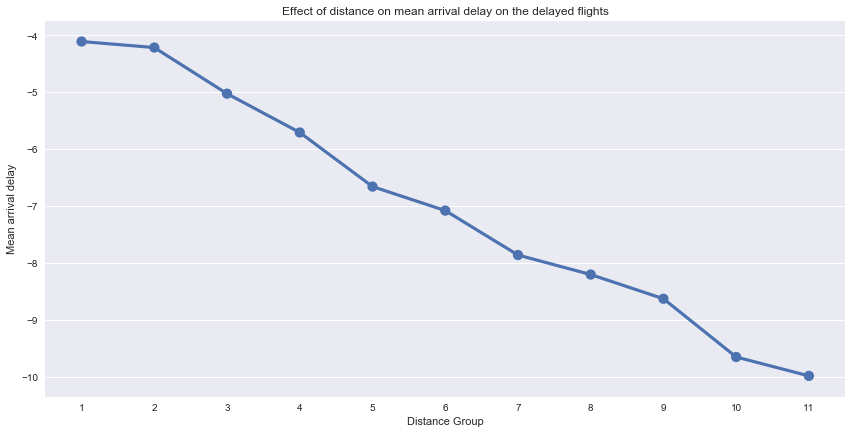

In [142]:
a = sns.factorplot(y='Mean arrival Delay', data=df3, x='DISTANCE_GROUP',aspect=2, kind='point',legend_out=True,size=6)
a.despine(left = True)
a.set_ylabels("Mean arrival delay")
a.set_xlabels("Distance Group")
plt.title('Effect of distance on mean arrival delay on the delayed flights')
#a.set_xticklabels(rotation=60)

####  The above graph shows shorter duration flights have more delays that longer duration flights reason being that longer duration flights even if delayed can catch up on the time by minor rerouting 

### Plot graphs for short distance flights :

In [143]:
short_dist_delay = df[((df.DEP_DELAY>0)&(df.ARR_DELAY>0)) & (df.DISTANCE_GROUP<6)]

In [144]:
flight_count = short_dist_delay.groupby(['ORIGIN','DEST'],as_index=False)[['YEAR']].count().\
rename(columns={'YEAR':'COUNT'}).sort_values(by='COUNT',ascending=False)

In [145]:
airports =pd.read_csv("airports.csv",low_memory=False)

In [146]:
flight_count = flight_count.merge(airports,left_on='ORIGIN',right_on='IATA_CODE')

In [147]:
flight_count.rename(columns={'LATITUDE':'LATITUDE_ORG','LONGITUDE':'LONGITUDE_ORG'},inplace=True)

In [148]:
flight_count = flight_count.merge(airports,left_on='DEST',right_on='IATA_CODE')

In [149]:
flight_count.rename(columns={'LATITUDE':'LATITUDE_DEST','LONGITUDE':'LONGITUDE_DEST'},inplace=True)

In [150]:
flight_count = flight_count.sort_values(by='COUNT',ascending=False)

In [151]:
plotly.tools.set_credentials_file(username='prachitamhankar', api_key='rXC6S9ev3GOFXIhXZnYh')


mapbox_access_token = 'pk.eyJ1IjoicHJhY2hpdGFtaGFua2FyIiwiYSI6ImNqaGZ2N3VtajFkYTIzNm5td3V0NmMxanEifQ.uF6TYlE_3PbQwoPhUCkFrw'

airports = Data([
    Scattermapbox(
        lat=flight_count.LATITUDE_ORG,
        lon=flight_count.LONGITUDE_ORG,
        mode='markers',
        marker=Marker(
            size=4,
            # color =final['COUNT'],
           # colorscale= 'Jet',
            showscale=False,
            cmax=121,
            cmin=0
        ),
        text=flight_count['ORIGIN'],
    )
])

flight_paths = []
for i in range(500):
    flight_paths.append(
        dict(
            type = 'scattermapbox',
            #locationmode = 'USA-states',
            lon = [ flight_count['LONGITUDE_ORG'][i], flight_count['LONGITUDE_DEST'][i] ],
            lat = [ flight_count['LATITUDE_ORG'][i], flight_count['LATITUDE_DEST'][i] ],
            mode = 'lines', 
            hoverinfo = 'text',
            text = flight_count.ORIGIN[i] + ' -> ' + flight_count.DEST[i],
            
            # text = 'ORIGIN',
            line = dict(
                width = 1,
                color = '#800080',
            ),
           opacity = float(flight_count['COUNT'][i])/float(flight_count['COUNT'].max()),
        )
    )

layout = dict(
        title = 'Short Distance Delayed Flights',
        mapbox=dict(
                accesstoken=mapbox_access_token,
                bearing=0,
                center=dict(
                    lat=40,
                    lon=-98
                ),
                pitch=0,
                zoom=3,
                style='light'
            ))



fig = dict(data=airports+flight_paths, layout=layout)
py.iplot(fig, filename='short distance flights')


### Above map is interactive, please zoom in and hover for more details. <br> The opacity of the line is decided by the frequency of the flights between the corresponding airports. </br>

#### Plot map for long distance flight

In [152]:
long_dist_delay = df[((df.DEP_DELAY>0)&(df.ARR_DELAY>0)) & (df.DISTANCE_GROUP>=6)]

In [153]:
flight_count = long_dist_delay.groupby(['ORIGIN','DEST'],as_index=False)[['YEAR']].count().\
rename(columns={'YEAR':'COUNT'}).sort_values(by='COUNT',ascending=False)

In [154]:
airports =pd.read_csv("airports.csv",low_memory=False)

In [155]:
flight_count = flight_count.merge(airports,left_on='ORIGIN',right_on='IATA_CODE')

In [156]:
flight_count.rename(columns={'LATITUDE':'LATITUDE_ORG','LONGITUDE':'LONGITUDE_ORG'},inplace=True)

In [157]:
flight_count = flight_count.merge(airports,left_on='DEST',right_on='IATA_CODE')

In [158]:
flight_count.rename(columns={'LATITUDE':'LATITUDE_DEST','LONGITUDE':'LONGITUDE_DEST'},inplace=True)

In [159]:
flight_count = flight_count.sort_values(by='COUNT',ascending=False)

In [160]:
plotly.tools.set_credentials_file(username='prachitamhankar', api_key='rXC6S9ev3GOFXIhXZnYh')


mapbox_access_token = 'pk.eyJ1IjoicHJhY2hpdGFtaGFua2FyIiwiYSI6ImNqaGZ2N3VtajFkYTIzNm5td3V0NmMxanEifQ.uF6TYlE_3PbQwoPhUCkFrw'

airports = Data([
    Scattermapbox(
        lat=flight_count.LATITUDE_ORG,
        lon=flight_count.LONGITUDE_ORG,
        mode='markers',
        marker=Marker(
            size=4,
            # color =final['COUNT'],
           # colorscale= 'Jet',
            showscale=False,
            cmax=121,
            cmin=0
        ),
        text=flight_count['ORIGIN'],
    )
])

flight_paths = []
for i in range(500):
    flight_paths.append(
        dict(
            type = 'scattermapbox',
            #locationmode = 'USA-states',
            lon = [ flight_count['LONGITUDE_ORG'][i], flight_count['LONGITUDE_DEST'][i] ],
            lat = [ flight_count['LATITUDE_ORG'][i], flight_count['LATITUDE_DEST'][i] ],
            mode = 'lines', 
            hoverinfo = 'text',
            text = flight_count.ORIGIN[i] + ' -> ' + flight_count.DEST[i],
            
            # text = 'ORIGIN',
            line = dict(
                width = 1,
                color = '#006400',
            ),
           opacity = float(flight_count['COUNT'][i])/float(flight_count['COUNT'].max()),
        )
    )

layout = dict(
        title = 'Long Distance Delayed Flights',
        mapbox=dict(
                accesstoken=mapbox_access_token,
                bearing=0,
                center=dict(
                    lat=40,
                    lon=-98
                ),
                pitch=0,
                zoom=3,
                style='light'
            ))



fig = dict(data=airports+flight_paths, layout=layout)
py.iplot(fig, filename='Long distance flights')


### Above map is interactive, please zoom in and hover for more details. <br> The opacity of the line is decided by the frequency of the flights between the corresponding airports. </br>

# MANAGERIAL INSIGHT - 3

<div class="alert alert-block alert-info">
<br>
**In long-distance flights, if the flight is delayed then the pilot can catch up on the lost time by minor rerouting and still manage to minimize the arrival delay. This is not the case with shorter distance time as no rerouting is possible. So the airlines should give a higher estimation of the taxi-in and taxi-out time thus maintaining an additional buffer for the delay caused for shorter distance flights.**



<br>
</div>

